# Battle of Neighborhoods, New York Mediterranean Restaurant

## 1.Introduction

### 1.1 Background

New York is a metropolis with huge diversity since many people from different countries and culture have emigrated to New York City. The city has consistently seen people from around the world move to the city. It has been a center for international diplomacy, trade and economic growth. New York is known as a worldwide cultural melting pot. While other states have had immigration surges, none have compared to the diversity and sheer number of immigrants that have made their way to the City. So these number of varies cultures combined to create a great diversity for itself. Since People from all over the world tend to come up here, we can see some many of their cultural aspects Transport, Food, Clothing, etc. 

### 1.2 Problem

A restaurant is a business that prepares and serves food and drinks to customers. Meals are generally served and eaten on the premises. Restaurants vary greatly in appearance and offerings, including a wide variety of cuisines and service models ranging from inexpensive fast food restaurants and cafeterias, to mid-priced family restaurants, to high-priced luxury establishments. It depends on the individual and there are so many of them with different cultural and various aspects in New York city. There are so many cuisines, which is based on the style of cooking, the ingredients, dishes and techniques. For our problem lets stick with Mediterranean cuisine. Let's assume in this one of the world's most diverse region we want to open a Mediterranean restaurant, so what are all the factors we have to take into account such as follows, • Market Places • Competition in particular location • Aiding places that make people come to restaurants like Gym, Entertaining Public places • Population • Menu from competitors Thus our solution needs to be data driven for avoiding or considering low risk criteria and high success rate and thus apply our overall knowledge in the techniques and the tools gained so far in this course.

### 1.3 Objective

The main interest of the Business to be started as an Mediterranean Cuisine restaurant would be to know about the many criteria that leads to come to a data driven conclusion for selecting the best neighborhood for opening one. But some of the criteria we are gonna be focusing on in our project is as follows,
•	Best Neighborhood for opening Restaurant in New York.
•	Area which lack Mediterranean Restaurants.
•	Places with best Mediterranean Restaurants.
•	Areas with Potential Mediterranean Restaurants.


In [3]:
# Data

I am going to use the data for the same New York Neighborhood example and the Geo spacial data of boundaries of the Neighborhoods in New York.

Data source : https://cocl.us/new_york_dataset

Geo-spacial data of the New York would be acquired by the following soure: https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm

and visualize  using Choropleth maps.

Finally the data going to be collected from the Foursquare API about the  restaurants in each neighborhood of New York city that include Mediterranean Restaurants, which will be used for acquiring the information regarding same for all the venues of each neighborhood.

Data source : Foursquare

# Methodology

The methodology to follow will be : Acquire the data from the various sources as mentioned below,

Filter the data for the required data acquired from Foursqaure which is only about Mediterranean Restaurants.

Acquire the tips and from that get the rating of every restaurant in the neighborhood of New York.

Visualize the findings using Matplot lib and Folium for better understanding.

# Data Analysis

In [1]:
import pandas as pd
import numpy as np
import requests
import os

import folium 


from geopy.geocoders import Nominatim 


import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
def get_new_york_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
    
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
    return new_york_data

In [3]:
df_ny = get_new_york_data()

In [4]:
df_ny.head(10)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


In [5]:
df_ny.shape

(306, 4)

OBSERVATION: There are 306 Neighborhood in NY, with the following distribution:
        Queens           81,
Brooklyn         70,
Staten Island    63,
Bronx            52,
Manhattan        40,

In [21]:
df_ny['Borough'].value_counts()

Queens           81
Brooklyn         70
Staten Island    63
Bronx            52
Manhattan        40
Name: Borough, dtype: int64

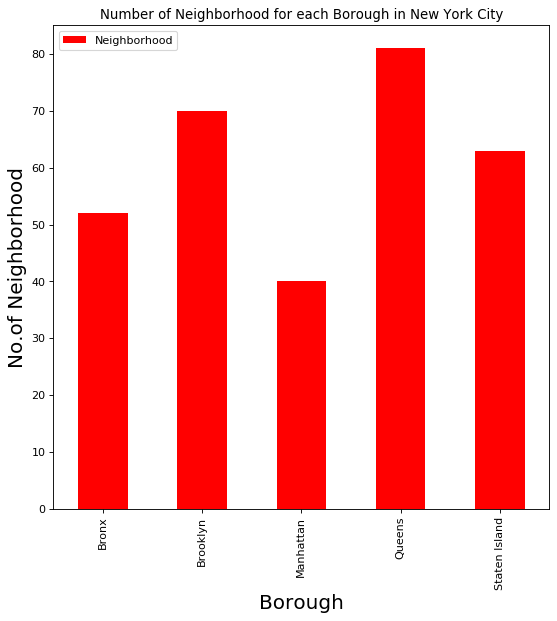

In [14]:
plt.figure(figsize=(8,8), dpi = 80)
# title
plt.title('Number of Neighborhood for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 18)
#On y-axis
plt.ylabel('No.of Neighborhood', fontsize=18)
#giving a bar plot
df_ny.groupby('Borough')['Neighborhood'].count().plot(kind='bar', color='Red')
#legend
plt.legend()
#displays the plot
plt.show()

In [7]:
address = 'New York, NY'

geolocator = Nominatim(user_agent="ny_explorator")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [4]:
def geo_location(address):
    # get geo location of address
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return latitude,longitude

Getting Info from Foursquare

In [9]:
def get_venues(lat,lng):
    
    #set variables
    radius=1000
    LIMIT=100
    CLIENT_ID = 'HGFZIPXCAGKCYI10FJ14W3ZWEEVIXRG0FW0BJE0WCPDMSOZC'
    CLIENT_SECRET = 'FIFN25KJUNOBII0YZYVCIMUNS0MMBOOL1OPDZPVWLAUYDB30'
    VERSION = '20180605' 
    
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
        
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

def get_venue_details(venue_id):
        
    CLIENT_ID = 'HGFZIPXCAGKCYI10FJ14W3ZWEEVIXRG0FW0BJE0WCPDMSOZC'
    CLIENT_SECRET = 'FIFN25KJUNOBII0YZYVCIMUNS0MMBOOL1OPDZPVWLAUYDB30'
    VERSION = '20180605' # Foursquare API version
    
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_name=venue_data['name']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
        
    column_names=['ID','Name','Likes','Rating','Tips']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

In [10]:
vns = get_venues(40.74105,-73.989)
vns[vns['Category']=='Mediterranean Restaurant']

,ID,Name,Category
21,59573747123a195de61b71b3,CAVA,Mediterranean Restaurant
63,5c5869388b98fd002c5de209,CAVA,Mediterranean Restaurant


In [11]:
spn_res = vns[vns['Category']=='Mediterranean Restaurant'].values.tolist()
spn_res

[['59573747123a195de61b71b3', 'CAVA', 'Mediterranean Restaurant'],
 ['5c5869388b98fd002c5de209', 'CAVA', 'Mediterranean Restaurant']]

In [12]:
len(vns[vns['Category']=='Mediterranean Restaurant'].values.tolist()) > 0

True

In [13]:
for row in df_ny.values.tolist():
    print(row)

['Bronx', 'Wakefield', 40.89470517661, -73.84720052054902]
['Bronx', 'Co-op City', 40.87429419303012, -73.82993910812398]
['Bronx', 'Eastchester', 40.887555677350775, -73.82780644716412]
['Bronx', 'Fieldston', 40.89543742690383, -73.90564259591682]
['Bronx', 'Riverdale', 40.890834493891305, -73.9125854610857]
['Bronx', 'Kingsbridge', 40.88168737120521, -73.90281798724604]
['Manhattan', 'Marble Hill', 40.87655077879964, -73.91065965862981]
['Bronx', 'Woodlawn', 40.89827261213805, -73.86731496814176]
['Bronx', 'Norwood', 40.87722415599446, -73.8793907395681]
['Bronx', 'Williamsbridge', 40.88103887819211, -73.85744642974207]
['Bronx', 'Baychester', 40.866858107252696, -73.83579759808117]
['Bronx', 'Pelham Parkway', 40.85741349808865, -73.85475564017999]
['Bronx', 'City Island', 40.84724670491813, -73.78648845267413]
['Bronx', 'Bedford Park', 40.870185164975325, -73.8855121841913]
['Bronx', 'University Heights', 40.85572707719664, -73.9104159619131]
['Bronx', 'Morris Heights', 40.847897926

In [14]:
# prepare neighborhood list that contains Mediterranean resturants
column_names=['Borough', 'Neighborhood', 'ID','Name']
Mediterranean_rest_ny=pd.DataFrame(columns=column_names)

print('Mediterranean restaurants in\n---------------------')
       
for row in df_ny.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    Mediterranean_resturants=venues[venues['Category']=='Mediterranean Restaurant']
    if len(Mediterranean_resturants) > 0:
        print(Neighborhood+', '+Borough+' : '+str(len(Mediterranean_resturants)))
    for resturant_detail in Mediterranean_resturants.values.tolist():
        id, name , category=resturant_detail
        Mediterranean_rest_ny = Mediterranean_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)

print('Completed constructing the Mediterranean cuisine restaurants data set')

Mediterranean restaurants in
---------------------
Brighton Beach, Brooklyn : 1
Sheepshead Bay, Brooklyn : 1
Manhattan Terrace, Brooklyn : 1
Flatbush, Brooklyn : 1
Williamsburg, Brooklyn : 1
Brooklyn Heights, Brooklyn : 1
Gerritsen Beach, Brooklyn : 1
Downtown, Brooklyn : 1
South Side, Brooklyn : 1
Inwood, Manhattan : 1
Hamilton Heights, Manhattan : 1
Manhattanville, Manhattan : 1
Upper East Side, Manhattan : 1
Upper West Side, Manhattan : 2
Lincoln Square, Manhattan : 1
Clinton, Manhattan : 1
Midtown, Manhattan : 2
Murray Hill, Manhattan : 1
Chelsea, Manhattan : 1
Greenwich Village, Manhattan : 2
Lower East Side, Manhattan : 2
Little Italy, Manhattan : 2
Soho, Manhattan : 3
West Village, Manhattan : 1
Gramercy, Manhattan : 3
Financial District, Manhattan : 2
Astoria, Queens : 2
Forest Hills, Queens : 1
Kew Gardens, Queens : 1
Long Island City, Queens : 1
Rego Park, Queens : 2
Bayside, Queens : 1
Oakland Gardens, Queens : 1
Lefrak City, Queens : 1
Rockaway Park, Queens : 1
Forest Hills

In [18]:
Mediterranean_rest_ny.head()

,Borough,Neighborhood,ID,Name
0,Brooklyn,Brighton Beach,4c819efadc018cfae6ddc76c,Beyti Turkish Kebab
1,Brooklyn,Sheepshead Bay,4b7f28eef964a520431b30e3,Anatolian Gyro
2,Brooklyn,Manhattan Terrace,4b5cba16f964a520d64029e3,Memo Shish Kebab
3,Brooklyn,Flatbush,4bb6b8702ea19521f32eac2f,Gyro King
4,Brooklyn,Williamsburg,53a1a98c498e019a787752d7,Meadowsweet


In [17]:

Mediterranean_rest_ny.shape

(67, 4)

In [19]:
Mediterranean_rest_ny['Borough'].value_counts()

Manhattan        35
Queens           14
Brooklyn         12
Staten Island     6
Name: Borough, dtype: int64

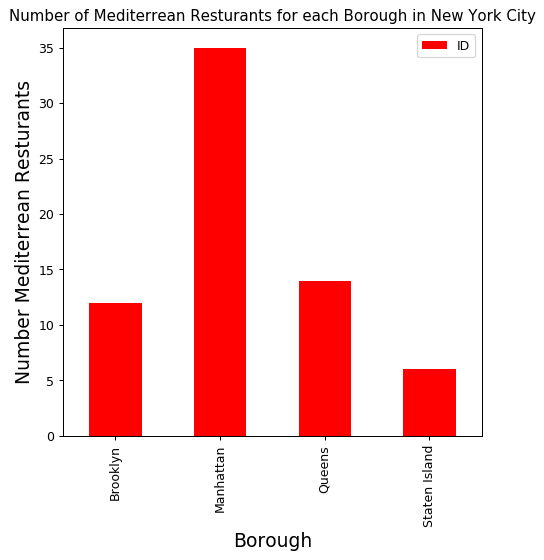

In [22]:
plt.figure(figsize=(6,6), dpi = 90)
# title
plt.title('Number of Mediterrean Resturants for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 15)
#On y-axis
plt.ylabel('Number Mediterrean Resturants', fontsize=15)
#giving a bar plot
Mediterranean_rest_ny.groupby('Borough')['ID'].count().plot(kind='bar', color='Red')
#legend
plt.legend()
#displays the plot
plt.show()

OBSERVATION; Bronx does not have Mediterrean Rest. Manhattan has the highest number of neighborhood with Mediterrenean rest.

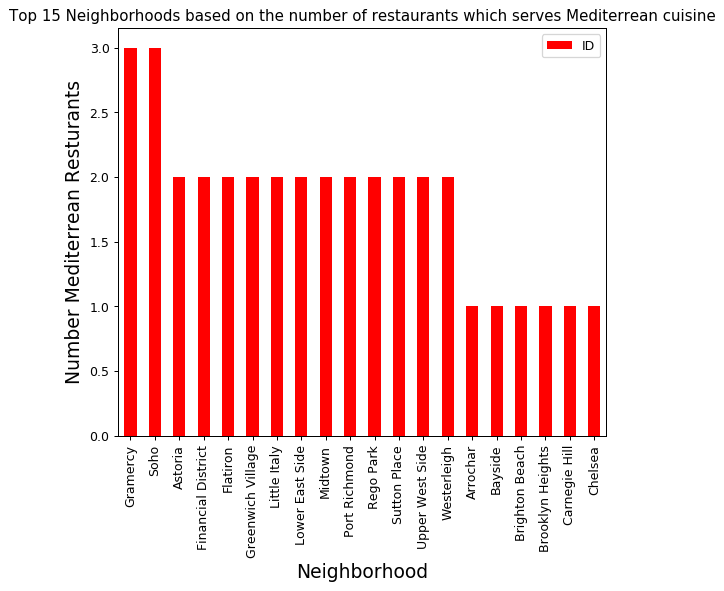

In [26]:
plt.figure(figsize=(7,6), dpi = 90)

plt.title('Top 15 Neighborhoods based on the number of restaurants which serves Mediterrean cuisine')

plt.xlabel('Neighborhood', fontsize = 15)

plt.ylabel('Number Mediterrean Resturants', fontsize=15)

Mediterranean_rest_ny.groupby('Neighborhood')['ID'].count().nlargest(20).plot(kind='bar', color='Red')

plt.legend()

plt.show()

In [ ]:
 OBSERVATION: Gramercy and Soho neghborhoods in Manhattan have the highest number of Mediterrean restaurants (3 Rests)

In [31]:
Mediterranean_rest_ny[Mediterranean_rest_ny['Neighborhood']=='Soho']


,Borough,Neighborhood,ID,Name
27,Manhattan,Soho,5b9ef2d9f8cbd4002c8c7c1e,19 Cleveland
28,Manhattan,Soho,59e0ee84f0ca95526b7fce9f,CAVA
29,Manhattan,Soho,59b4898de1f0aa6d9ec6d507,Shuka


In [32]:
Mediterranean_rest_ny[Mediterranean_rest_ny['Neighborhood']=='Gramercy']

,Borough,Neighborhood,ID,Name
31,Manhattan,Gramercy,59573747123a195de61b71b3,CAVA
32,Manhattan,Gramercy,4ae32479f964a520e09021e3,Barbounia
33,Manhattan,Gramercy,4a956d28f964a5202d2320e3,Bite


In [34]:
# prepare neighborhood list that contains mediterranean resturants
column_names=['Borough', 'Neighborhood', 'ID','Name','Likes','Rating','Tips']
Mediterrean_rest_stats_ny=pd.DataFrame(columns=column_names)
count=1


for row in Mediterranean_rest_ny.values.tolist():
    Borough,Neighborhood,ID,Name=row
    try:
        venue_details=get_venue_details(ID)
        print(venue_details)
        id,name,likes,rating,tips=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',ID)
        # we will assign 0 value for these resturants as they may have been 
        #recently opened or details does not exist in FourSquare Database
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(Mediterranean_rest_ny),')','processed')
    Mediterrean_rest_stats_ny = Mediterrean_rest_stats_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1

                         ID                 Name  Likes  Rating  Tips
0  4c819efadc018cfae6ddc76c  Beyti Turkish Kebab     58     8.2    26
( 1 / 67 ) processed
                         ID            Name  Likes  Rating  Tips
0  4b7f28eef964a520431b30e3  Anatolian Gyro     59     7.8    25
( 2 / 67 ) processed
                         ID              Name  Likes  Rating  Tips
0  4b5cba16f964a520d64029e3  Memo Shish Kebab     75     7.9    41
( 3 / 67 ) processed
                         ID       Name  Likes  Rating  Tips
0  4bb6b8702ea19521f32eac2f  Gyro King     40     8.4    17
( 4 / 67 ) processed
                         ID         Name  Likes  Rating  Tips
0  53a1a98c498e019a787752d7  Meadowsweet    390     9.0    96
( 5 / 67 ) processed
                         ID  Name  Likes  Rating  Tips
0  5c3ebf15c0f163002ce6db6f  CAVA     19     8.2     3
( 6 / 67 ) processed
Empty DataFrame
Columns: [ID, Name, Likes, Rating, Tips]
Index: []
No data available for id= 4b89decff964a520c85232e

KeyError: 'venue'

In [37]:

Mediterrean_rest_stats_ny.head(67)

,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
0,Brooklyn,Brighton Beach,4c819efadc018cfae6ddc76c,Beyti Turkish Kebab,58,8.2,26
1,Brooklyn,Sheepshead Bay,4b7f28eef964a520431b30e3,Anatolian Gyro,59,7.8,25
2,Brooklyn,Manhattan Terrace,4b5cba16f964a520d64029e3,Memo Shish Kebab,75,7.9,41
3,Brooklyn,Flatbush,4bb6b8702ea19521f32eac2f,Gyro King,40,8.4,17
4,Brooklyn,Williamsburg,53a1a98c498e019a787752d7,Meadowsweet,390,9.0,96
5,Brooklyn,Brooklyn Heights,5c3ebf15c0f163002ce6db6f,CAVA,19,8.2,3
6,Brooklyn,Gerritsen Beach,0,0,0,0.0,0
7,Brooklyn,Downtown,5c3ebf15c0f163002ce6db6f,CAVA,19,8.2,3
8,Brooklyn,South Side,53a1a98c498e019a787752d7,Meadowsweet,390,9.0,96
9,Manhattan,Inwood,53dae39c498eb5711af31829,Cocina Taller,19,8.3,3


In [36]:
Mediterrean_rest_stats_ny.shape

(49, 7)

In [38]:
Mediterrean_rest_stats_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Borough       49 non-null     object 
 1   Neighborhood  49 non-null     object 
 2   ID            49 non-null     object 
 3   Name          49 non-null     object 
 4   Likes         49 non-null     object 
 5   Rating        49 non-null     float64
 6   Tips          49 non-null     object 
dtypes: float64(1), object(6)
memory usage: 1.6+ KB


In [39]:
convert_types = { 'Likes': float, 'Tips': float }
Mediterrean_rest_stats_ny = Mediterrean_rest_stats_ny.astype(convert_types)
Mediterrean_rest_stats_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Borough       49 non-null     object 
 1   Neighborhood  49 non-null     object 
 2   ID            49 non-null     object 
 3   Name          49 non-null     object 
 4   Likes         49 non-null     float64
 5   Rating        49 non-null     float64
 6   Tips          49 non-null     float64
dtypes: float64(3), object(4)
memory usage: 2.0+ KB


In [40]:
Mediterrean_rest_stats_ny.iloc[Mediterrean_rest_stats_ny['Tips'].idxmax()]

Borough                        Manhattan
Neighborhood                     Chelsea
ID              45b24bbef964a520a5411fe3
Name                         Fig & Olive
Likes                                733
Rating                               8.6
Tips                                 232
Name: 20, dtype: object

In [41]:
Mediterrean_rest_stats_ny.iloc[Mediterrean_rest_stats_ny['Rating'].idxmax()]

Borough                        Manhattan
Neighborhood           Greenwich Village
ID              59e0ee84f0ca95526b7fce9f
Name                                CAVA
Likes                                109
Rating                               9.3
Tips                                  13
Name: 22, dtype: object

In [42]:
Mediterrean_rest_stats_ny.iloc[Mediterrean_rest_stats_ny['Likes'].idxmax()]

Borough                        Manhattan
Neighborhood                     Chelsea
ID              45b24bbef964a520a5411fe3
Name                         Fig & Olive
Likes                                733
Rating                               8.6
Tips                                 232
Name: 20, dtype: object

In [48]:
ny_neighborhood_stats=Mediterrean_rest_stats_ny.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
ny_neighborhood_stats.columns=['Neighborhood', 'Average Rating']

top 10 Rest

In [49]:
ny_neighborhood_stats.sort_values(['Average Rating'],ascending=False).head(10)

,Neighborhood,Average Rating
35,West Village,9.30
19,Little Italy,9.25
31,Soho,9.20
13,Greenwich Village,9.20
18,Lincoln Square,9.00
32,South Side,9.00
36,Williamsburg,9.00
5,Clinton,9.00
25,Murray Hill,8.90
24,Midtown,8.85


In [50]:
ny_borough_stats=Mediterrean_rest_stats_ny.groupby('Borough',as_index=False).mean()[['Borough','Rating']]
ny_borough_stats.columns=['Borough','Average Rating']

In [51]:
ny_borough_stats.sort_values(['Average Rating'],ascending=False).head()

,Borough,Average Rating
1,Manhattan,8.781481
3,Staten Island,7.600000
0,Brooklyn,7.411111
2,Queens,7.125000


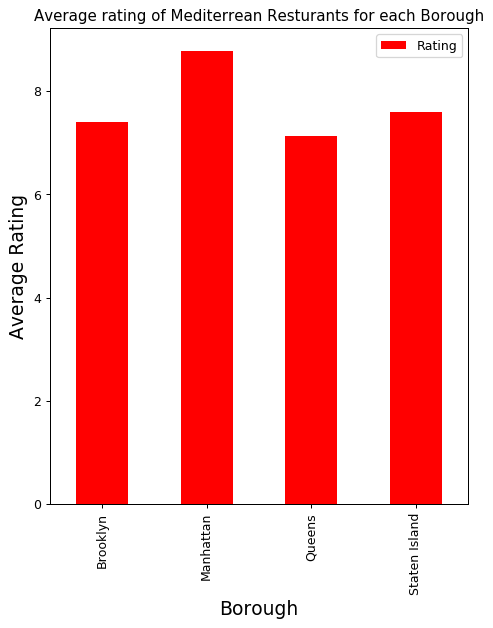

In [52]:

plt.figure(figsize=(6,7), dpi = 90)

plt.title('Average rating of Mediterrean Resturants for each Borough')

plt.xlabel('Borough', fontsize = 15)

plt.ylabel('Average Rating', fontsize=15)

Mediterrean_rest_stats_ny.groupby('Borough').mean()['Rating'].plot(kind='bar', color='Red')

plt.legend()

plt.show()

In [53]:
ny_neighborhood_stats=ny_neighborhood_stats[ny_neighborhood_stats['Average Rating']>=8.0]

In [54]:
ny_neighborhood_stats

,Neighborhood,Average Rating
2,Brighton Beach,8.200000
3,Brooklyn Heights,8.200000
4,Chelsea,8.600000
5,Clinton,9.000000
6,Downtown,8.200000
7,Financial District,8.000000
8,Flatbush,8.400000
9,Forest Hills,8.100000
10,Forest Hills Gardens,8.100000
12,Gramercy,8.833333


In [55]:
ny_neighborhood_stats=pd.merge(ny_neighborhood_stats,df_ny, on='Neighborhood')

In [56]:
ny_neighborhood_stats=ny_neighborhood_stats[['Borough','Neighborhood','Latitude','Longitude','Average Rating']]

In [57]:
ny_neighborhood_stats

,Borough,Neighborhood,Latitude,Longitude,Average Rating
0,Brooklyn,Brighton Beach,40.576825,-73.965094,8.200000
1,Brooklyn,Brooklyn Heights,40.695864,-73.993782,8.200000
2,Manhattan,Chelsea,40.744035,-74.003116,8.600000
3,Staten Island,Chelsea,40.594726,-74.189560,8.600000
4,Manhattan,Clinton,40.759101,-73.996119,9.000000
5,Brooklyn,Downtown,40.690844,-73.983463,8.200000
6,Manhattan,Financial District,40.707107,-74.010665,8.000000
7,Brooklyn,Flatbush,40.636326,-73.958401,8.400000
8,Queens,Forest Hills,40.725264,-73.844475,8.100000
9,Queens,Forest Hills Gardens,40.714611,-73.841022,8.100000


In [58]:
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)

In [59]:

incidents = folium.map.FeatureGroup()


for lat, lng, in ny_neighborhood_stats[['Latitude','Longitude']].values:
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, 
            color='#EA1253',
            fill=True,
            fill_color='#12EA92',
            fill_opacity=0.4
        )
    )

In [ ]:
ny_neighborhood_stats['Label']=ny_neighborhood_stats['Neighborhood']+', '+ny_neighborhood_stats['Borough']+'('+ny_neighborhood_stats['Average Rating'].map(str)+')'

In [61]:
# add pop-up text to each marker on the map
for lat, lng, label in ny_neighborhood_stats[['Latitude','Longitude','Label']].values:
    folium.Marker([lat, lng], popup=label).add_to(ny_map)        
# add incidents to map
ny_map.add_child(incidents)

In [64]:
ny_geo = r"Borough Boundaries.geojson"

ny_map2.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlGnBu',
    fill_opacity=0.6, 
    line_opacity=0.4,
    legend_name='Average Rating'
)


ny_map2

In [63]:
ny_map2 = folium.Map(location=geo_location('New York'), zoom_start=11)
ny_geo = r"Borough Boundaries.geojson"

ny_map.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlGnBu',
    fill_opacity=0.6, 
    line_opacity=0.4,
    legend_name='Average Rating'
)

ny_map2
ny_map.save('rated-map.html')

In [ ]:
ny_map3 = folium.Map(location=geo_location('New York'), zoom_start=11)
ny_geo = r"Borough Boundaries.geojson"

ny_map.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough'],
    key_on='feature.properties.boro_name',
    fill_color='YlGnBu',
    fill_opacity=0.6, 
    line_opacity=0.4,
    legend_name='Average Rating'
)

ny_map3


In [26]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import json # library to handle JSON files

In [9]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [10]:
neighborhoods_data = newyork_data['features']

Tranform the data into a pandas dataframe
The next task is essentially transforming this data of nested Python dictionaries into a pandas dataframe. So let's start by creating an empty dataframe.

In [11]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [12]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [13]:
neighborhoods['Borough'].value_counts()

Queens           81
Brooklyn         70
Staten Island    63
Bronx            52
Manhattan        40
Name: Borough, dtype: int64

In [14]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorator")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [16]:
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)
map_newyork

In [17]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=False,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

In [18]:
CLIENT_ID = 'HGFZIPXCAGKCYI10FJ14W3ZWEEVIXRG0FW0BJE0WCPDMSOZC' # your Foursquare ID
CLIENT_SECRET = 'FIFN25KJUNOBII0YZYVCIMUNS0MMBOOL1OPDZPVWLAUYDB30' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: HGFZIPXCAGKCYI10FJ14W3ZWEEVIXRG0FW0BJE0WCPDMSOZC
CLIENT_SECRET:FIFN25KJUNOBII0YZYVCIMUNS0MMBOOL1OPDZPVWLAUYDB30


In [20]:
neighborhood_latitude = neighborhoods.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = neighborhoods.loc[0, 'Longitude'] # neighborhood longitude value

neighborhood_name = neighborhoods.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Wakefield are 40.89470517661, -73.84720052054902.


Now, let's get the top 33 venues that are in Wakefield within a radius of 500 meters.

In [21]:
# type your answer here
LIMIT = 33
radius = 500
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?&client_id=HGFZIPXCAGKCYI10FJ14W3ZWEEVIXRG0FW0BJE0WCPDMSOZC&client_secret=FIFN25KJUNOBII0YZYVCIMUNS0MMBOOL1OPDZPVWLAUYDB30&v=20180605&ll=40.89470517661,-73.84720052054902&radius=500&limit=33'

In [22]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5fd501055b96957c3316ab8e'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Wakefield',
  'headerFullLocation': 'Wakefield, Bronx',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 9,
  'suggestedBounds': {'ne': {'lat': 40.899205181110005,
    'lng': -73.84125857127495},
   'sw': {'lat': 40.89020517211, 'lng': -73.8531424698231}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4c537892fd2ea593cb077a28',
       'name': 'Lollipops Gelato',
       'location': {'address': '4120 Baychester Ave',
        'crossStreet': 'Edenwald & Bussing Ave',
        'lat': 40.894123150205274,
        'lng': -73.84589162362325,
        'labeledLatLn

In [23]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [27]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

C:\Users\alpar\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


,name,categories,lat,lng
0,Lollipops Gelato,Dessert Shop,40.894123,-73.845892
1,Rite Aid,Pharmacy,40.896649,-73.844846
2,Walgreens,Pharmacy,40.896528,-73.844700
3,Carvel Ice Cream,Ice Cream Shop,40.890487,-73.848568
4,Dunkin',Donut Shop,40.890459,-73.849089


In [28]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

9 venues were returned by Foursquare.


In [29]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [30]:
# type your answer here
New_York_venues = getNearbyVenues(names=neighborhoods['Neighborhood'],
                                   latitudes=neighborhoods['Latitude'],
                                   longitudes=neighborhoods['Longitude']
                                  )

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [31]:
print(New_York_venues.shape)
New_York_venues.head()

(6436, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


In [32]:
New_York_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,30,30,30,30,30,30
Annadale,11,11,11,11,11,11
Arden Heights,5,5,5,5,5,5
Arlington,6,6,6,6,6,6
Arrochar,21,21,21,21,21,21
Arverne,20,20,20,20,20,20
Astoria,33,33,33,33,33,33
Astoria Heights,13,13,13,13,13,13
Auburndale,20,20,20,20,20,20


In [33]:
print('There are {} uniques categories.'.format(len(New_York_venues['Venue Category'].unique())))

There are 391 uniques categories.


In [34]:
# one hot encoding
New_York_onehot = pd.get_dummies(New_York_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
New_York_onehot['Neighborhood'] = New_York_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [New_York_onehot.columns[-1]] + list(New_York_onehot.columns[:-1])
New_York_onehot = New_York_onehot[fixed_columns]

New_York_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Outlet Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pil

In [35]:
New_York_grouped = New_York_onehot.groupby('Neighborhood').mean().reset_index()
New_York_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Outlet Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pil

In [36]:
num_top_venues = 5

for hood in New_York_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = New_York_grouped[New_York_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
                venue  freq
0         Pizza Place  0.13
1       Deli / Bodega  0.07
2         Supermarket  0.07
3                 Spa  0.07
4  Chinese Restaurant  0.07


----Annadale----
                 venue  freq
0          Pizza Place  0.18
1  American Restaurant  0.18
2        Deli / Bodega  0.09
3           Restaurant  0.09
4                 Food  0.09


----Arden Heights----
           venue  freq
0  Deli / Bodega   0.2
1       Pharmacy   0.2
2    Coffee Shop   0.2
3       Bus Stop   0.2
4    Pizza Place   0.2


----Arlington----
           venue  freq
0  Deli / Bodega  0.17
1       Bus Stop  0.17
2    Coffee Shop  0.17
3   Home Service  0.17
4  Boat or Ferry  0.17


----Arrochar----
                venue  freq
0            Bus Stop  0.14
1  Italian Restaurant  0.10
2       Deli / Bodega  0.10
3         Supermarket  0.05
4   Polish Restaurant  0.05


----Arverne----
            venue  freq
0       Surf Spot  0.20
1  Sandwich Place  0.10
2   Metro Station  0.10
3

                venue  freq
0         Bus Station  0.12
1      Baseball Field  0.06
2         Post Office  0.06
3  Chinese Restaurant  0.06
4                Park  0.06


----Cobble Hill----
                       venue  freq
0         Italian Restaurant  0.09
1                Yoga Studio  0.06
2                        Bar  0.06
3               Cocktail Bar  0.06
4  Middle Eastern Restaurant  0.06


----College Point----
                       venue  freq
0              Deli / Bodega  0.06
1                Pizza Place  0.06
2         Mexican Restaurant  0.06
3  Latin American Restaurant  0.06
4                     Bakery  0.06


----Concord----
                 venue  freq
0   Italian Restaurant  0.14
1           Bagel Shop  0.14
2          Coffee Shop  0.14
3  Peruvian Restaurant  0.14
4        Grocery Store  0.14


----Concourse----
                  venue  freq
0         Grocery Store  0.14
1         Deli / Bodega  0.07
2    Spanish Restaurant  0.07
3   Fried Chicken Joint  0.07
4  F



----Fox Hills----
                venue  freq
0  African Restaurant   0.2
1            Bus Stop   0.2
2       Grocery Store   0.2
3          Playground   0.2
4      Sandwich Place   0.2


----Fresh Meadows----
                           venue  freq
0                    Bus Station  0.23
1                       Pharmacy  0.15
2             Chinese Restaurant  0.15
3  Vegetarian / Vegan Restaurant  0.08
4                     Playground  0.08


----Fulton Ferry----
            venue  freq
0            Park  0.12
1  Ice Cream Shop  0.09
2     Pizza Place  0.06
3  Scenic Lookout  0.06
4   Boat or Ferry  0.06


----Georgetown----
                venue  freq
0                Bank  0.11
1          Donut Shop  0.07
2            Pharmacy  0.07
3       Shopping Mall  0.04
4  Mexican Restaurant  0.04


----Gerritsen Beach----
             venue  freq
0   Ice Cream Shop  0.11
1              Bar  0.11
2  Harbor / Marina  0.06
3      Pizza Place  0.06
4       Bagel Shop  0.06


----Glen Oaks----
  

4                 Bar  0.06


----Longwood----
                       venue  freq
0              Deli / Bodega  0.14
1       Fast Food Restaurant  0.14
2                      Diner  0.14
3              Grocery Store  0.14
4  Latin American Restaurant  0.14


----Lower East Side----
                 venue  freq
0                 Café  0.06
1  Japanese Restaurant  0.06
2   Chinese Restaurant  0.06
3          Coffee Shop  0.06
4     Ramen Restaurant  0.06


----Madison----
                venue  freq
0          Bagel Shop  0.18
1  Italian Restaurant  0.09
2         Candy Store  0.09
3       Deli / Bodega  0.09
4        Dessert Shop  0.09


----Malba----
                  venue  freq
0             Rest Area  0.33
1              Bus Line  0.33
2          Tennis Court  0.33
3           Yoga Studio  0.00
4  Other Great Outdoors  0.00


----Manhattan Beach----
             venue  freq
0             Café  0.22
1             Food  0.11
2       Playground  0.11
3            Beach  0.11
4  Harbor 

              venue  freq
0       Pizza Place  0.25
1  Sushi Restaurant  0.12
2        Bagel Shop  0.12
3         Pet Store  0.12
4    Ice Cream Shop  0.12


----Prospect Heights----
             venue  freq
0              Bar  0.15
1  Thai Restaurant  0.06
2   Ice Cream Shop  0.06
3     Cocktail Bar  0.06
4    Garden Center  0.03


----Prospect Lefferts Gardens----
                  venue  freq
0                  Café  0.12
1  Caribbean Restaurant  0.09
2                Bakery  0.09
3             Wine Shop  0.06
4     Indian Restaurant  0.06


----Prospect Park South----
                       venue  freq
0       Caribbean Restaurant  0.12
1          Mobile Phone Shop  0.09
2              Grocery Store  0.09
3  Latin American Restaurant  0.06
4         Mexican Restaurant  0.06


----Queens Village----
                venue  freq
0                Bank  0.15
1    Department Store  0.08
2  Salon / Barbershop  0.08
3   Mobile Phone Shop  0.08
4          Donut Shop  0.08


----Queensboro H

                venue  freq
0      Sandwich Place  0.12
1       Deli / Bodega  0.12
2  Italian Restaurant  0.12
3      Cosmetics Shop  0.12
4            Bus Stop  0.12


----Travis----
                venue  freq
0               Hotel  0.21
1                 Gym  0.14
2  Spanish Restaurant  0.07
3        Home Service  0.07
4       Bowling Alley  0.07


----Tribeca----
                 venue  freq
0                  Spa  0.06
1             Wine Bar  0.06
2           Steakhouse  0.06
3  American Restaurant  0.06
4     Greek Restaurant  0.06


----Tudor City----
                venue  freq
0                Park  0.09
1       Deli / Bodega  0.06
2  Mexican Restaurant  0.06
3    Sushi Restaurant  0.06
4         Coffee Shop  0.03


----Turtle Bay----
                venue  freq
0         Karaoke Bar  0.06
1  Seafood Restaurant  0.06
2                Park  0.06
3         Coffee Shop  0.06
4              Lounge  0.03


----Unionport----
                       venue  freq
0             Ice Crea

In [37]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [49]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = New_York_grouped['Neighborhood']

for ind in np.arange(New_York_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(New_York_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Deli / Bodega,Supermarket,Spa,Chinese Restaurant,Playground,Cosmetics Shop,Martial Arts School,Gas Station,Dessert Shop
1,Annadale,Pizza Place,American Restaurant,Food,Park,Dance Studio,Deli / Bodega,Train Station,Diner,Restaurant,Farm
2,Arden Heights,Pizza Place,Deli / Bodega,Pharmacy,Coffee Shop,Bus Stop,Women's Store,Exhibit,Eye Doctor,Factory,Falafel Restaurant
3,Arlington,Home Service,Deli / Bodega,Grocery Store,Bus Stop,Boat or Ferry,Coffee Shop,Women's Store,Eye Doctor,Factory,Falafel Restaurant
4,Arrochar,Bus Stop,Deli / Bodega,Italian Restaurant,Pizza Place,Supermarket,Middle Eastern Restaurant,Mediterranean Restaurant,Outdoors & Recreation,Liquor Store,Sandwich Place


# Cluster Neighborhoods

In [40]:
from sklearn.cluster import KMeans

Run k-means to cluster the neighborhood into 10 clusters

In [55]:
# set number of clusters
kclusters = 8

New_York_grouped_clustering = New_York_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(New_York_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:40] 

array([0, 0, 1, 1, 1, 5, 5, 0, 5, 0, 5, 5, 5, 0, 5, 7, 0, 5, 0, 5, 1, 1,
       1, 0, 5, 1, 5, 5, 0, 5, 1, 5, 1, 0, 0, 5, 1, 5, 0, 5])

In [51]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

New_York_merged = neighborhoods

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
New_York_merged = New_York_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
New_York_merged.head() # check the last columns!

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,0,Pharmacy,Donut Shop,Ice Cream Shop,Deli / Bodega,Dessert Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Exhibit
1,Bronx,Co-op City,40.874294,-73.829939,0,Bus Station,Pharmacy,Pizza Place,Baseball Field,Bar,Bagel Shop,Park,Trail,Fast Food Restaurant,Chinese Restaurant
2,Bronx,Eastchester,40.887556,-73.827806,0,Bus Station,Caribbean Restaurant,Deli / Bodega,Diner,Donut Shop,Juice Bar,Metro Station,Fast Food Restaurant,Chinese Restaurant,Bowling Alley
3,Bronx,Fieldston,40.895437,-73.905643,5,Plaza,Medical Supply Store,River,Filipino Restaurant,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm
4,Bronx,Riverdale,40.890834,-73.912585,5,Park,Plaza,Food Truck,Bus Station,Gym,Bank,Home Service,Playground,Moving Target,Distillery


In [52]:
New_York_grouped_clustering.head(45)

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Outlet Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pilates Studio,P

In [45]:
New_York_merged.head()

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,4,Pharmacy,Donut Shop,Ice Cream Shop,Deli / Bodega,Dessert Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Exhibit
1,Bronx,Co-op City,40.874294,-73.829939,4,Bus Station,Pharmacy,Pizza Place,Baseball Field,Bar,Bagel Shop,Park,Trail,Fast Food Restaurant,Chinese Restaurant
2,Bronx,Eastchester,40.887556,-73.827806,9,Bus Station,Caribbean Restaurant,Deli / Bodega,Diner,Donut Shop,Juice Bar,Metro Station,Fast Food Restaurant,Chinese Restaurant,Bowling Alley
3,Bronx,Fieldston,40.895437,-73.905643,5,Plaza,Medical Supply Store,River,Filipino Restaurant,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm
4,Bronx,Riverdale,40.890834,-73.912585,4,Park,Plaza,Food Truck,Bus Station,Gym,Bank,Home Service,Playground,Moving Target,Distillery


In [53]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(New_York_merged['Latitude'], New_York_merged['Longitude'], New_York_merged['Neighborhood'], New_York_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# CONCLUSION

In [56]:
Based on the Data Analysis and Visualization using Folium and Matplotlib we have rendered various bar charts and two maps from which we can come to a better understanding of the interests we had earlier to be discovered which are specified as follows.

In spite of a population and market data We could proposed that the best Boroughs for opening a Mediterrean Restaurant in New York are: Queens, Brooklyn and State Island. Bronx does not have Mediterrean Restaurants, which could be a great opportunity, however it is important to review this borough security and market to propose it as a potential place to ope a Mediterrenean Restaurant.
Queens ranks last in average rating of Mediterrean Resturants and Manhattan rank first. Places with best Mediterrean Cuisine. Manhattan is the best place to stay if you prefer Mediterrean Restaurants. Areas with Potential. Queens and Brooklyn have potential Mediterrean Resturant Market.
Bronx does not present any cluster neighboorhood similar to those one with susscefull Mediterranean Restaurants, Thus We don't recommend open  a Mediterranean restaurant in Bronx.

Four areas were identified as good prospect to opening a Mediterranean Restaurant. Two areas in Long Island one in Brooklyn and other one in Queens. The Neighborhoods suggested area: Sea Gate, Bloomfield and Travis in Long Island. Conney Island in Brooklyn and Canarsie and Hammels in Queens.  

SyntaxError: invalid syntax (<ipython-input-56-8442d392276d>, line 1)